# Amelia's Single-cell experiment - clean up and annotate

## Load in libraries

In [1]:
import scanpy as sc

sc.logging.print_header()


scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.2.1 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.8


## Read in the files

We will try to get rid of non-T cells and attempt a simple annotation.

In [2]:
adata = sc.read_h5ad("write/adata_with_tcr.h5ad")
try:
    adata.uns.pop("log1p")  # why do i have to do this?
except:
    pass
adata

AnnData object with n_obs × n_vars = 10568 × 1731
    obs: 'sample_id', 'sample_num', 'group', 'tissue', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ig', 'pct_counts_ig', 'leiden', 'filter_rna', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VDJ_main', 'j_call_VJ_main', 'c_call_VDJ_main', 'c_call_VJ_main', 'v_call_abT_VDJ_main', 'd_call_a

# Try batch correction

In [3]:
sc.external.pp.bbknn(adata, "sample_id")
sc.tl.leiden(adata)
sc.tl.umap(adata, min_dist=0.3)


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


## Visualise the results

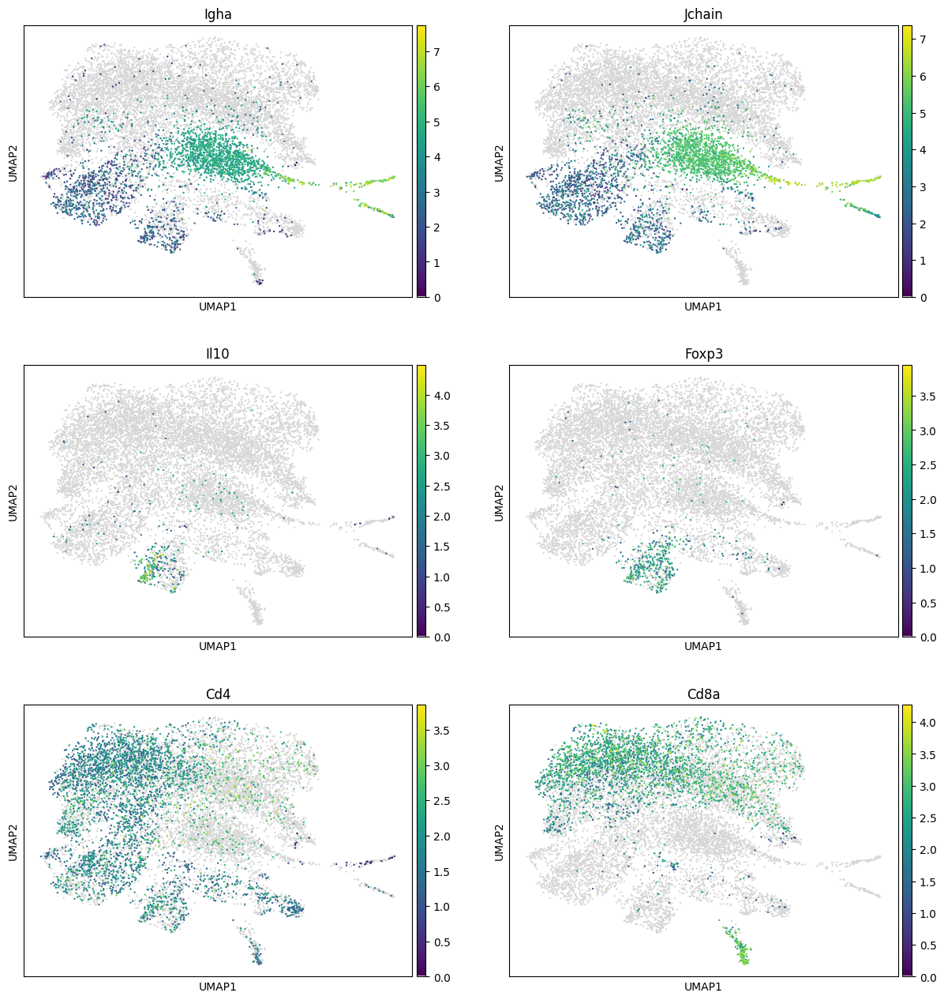

In [4]:
import tools

sc.pl.umap(
    adata,
    color=[
        "Igha",
        "Jchain",
        "Il10",
        "Foxp3",
        "Cd4",
        "Cd8a",
    ],
    color_map=tools.cmp(),
    ncols=2,
)

/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


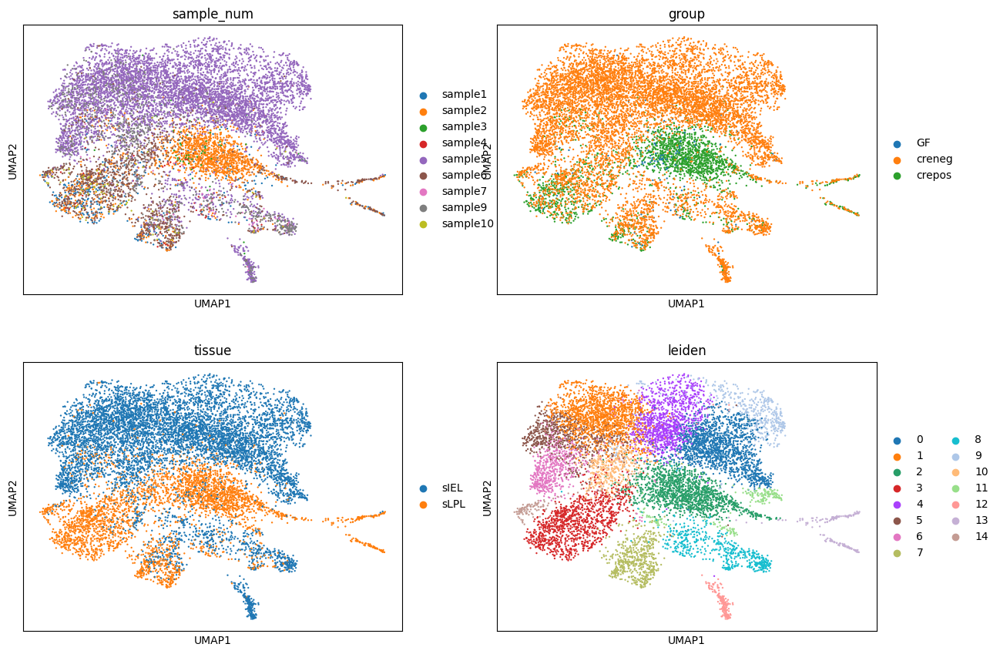

In [5]:
sc.pl.umap(
    adata,
    color=[
        "sample_num",
        "group",
        "tissue",
        "leiden",
    ],
    ncols=2,
)


/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


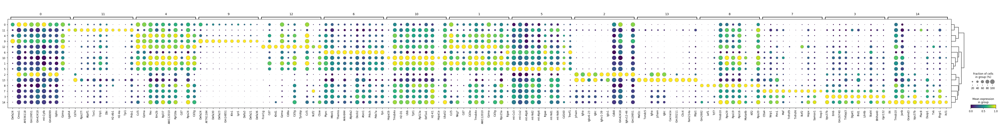

In [6]:
sc.tl.rank_genes_groups(adata, groupby="leiden", method="wilcoxon")
sc.pl.rank_genes_groups_dotplot(
    adata, n_genes=10, min_logfoldchange=1, standard_scale="var", color_map="viridis"
)


/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


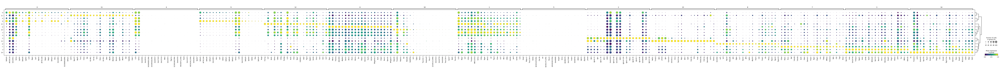

In [7]:
sc.pl.rank_genes_groups_dotplot(
    adata, n_genes=20, min_logfoldchange=2, standard_scale="var", color_map="viridis"
)


/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


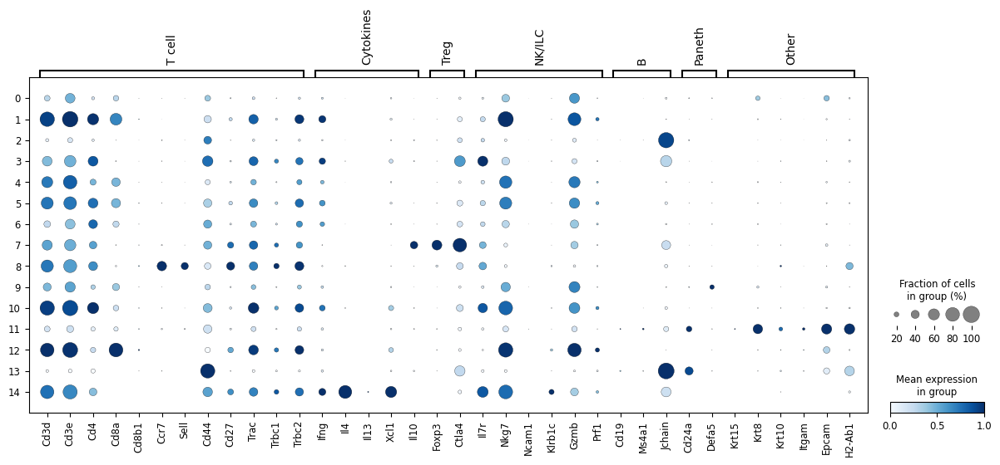

In [22]:
sc.pl.dotplot(
    adata,
    {
        "T cell": [
            "Cd3d",
            "Cd3e",
            "Cd4",
            "Cd8a",
            "Cd8b1",
            "Ccr7",
            "Sell",
            "Cd44",
            "Cd27",
            "Trac",
            "Trbc1",
            "Trbc2",
        ],
        "Cytokines": ["Ifng", "Il4", "Il13", "Xcl1", "Il10"],
        "Treg": ["Foxp3", "Ctla4"],
        "NK/ILC": ["Il7r", "Nkg7", "Ncam1", "Klrb1c", "Gzmb", "Prf1"],
        "B": ["Cd19", "Ms4a1", "Jchain"],
        "Paneth": ["Cd24a", "Defa5"],
        "Other": ["Krt15", "Krt8", "Krt10", "Itgam", "Epcam", "H2-Ab1"],
    },
    groupby="leiden",
    standard_scale="var",
    color_map="Blues",
)


In [17]:
cell_dict = {
    "0": "Epithelial",
    "1": "Tem",
    "2": "B",
    "3": "Tem",
    "4": "Tem",
    "5": "Tem",
    "6": "Tem",
    "7": "Treg",
    "8": "Tcm",
    "9": "Epithelial",
    "10": "Tem",
    "11": "Epithelial",
    "12": "NKT",
    "13": "B",
    "14": "Tem_Th2",
}
adata.obs["celltype"] = [cell_dict[x] for x in adata.obs["leiden"]]

/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


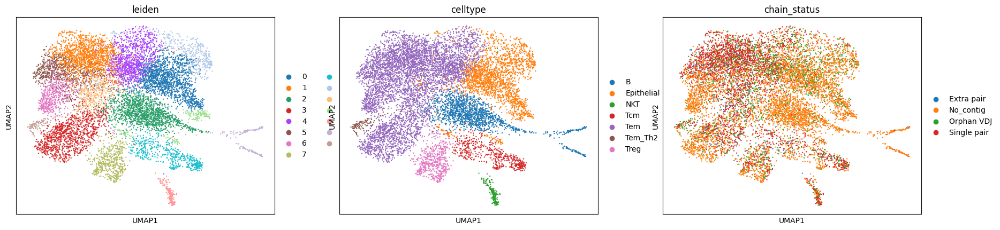

In [18]:
sc.pl.umap(
    adata,
    color=[
        "leiden",
        "celltype",
        "chain_status",
    ],
    ncols=3,
)


In [19]:
# save
adata.write_h5ad("write/adata_with_tcr.h5ad", compression="gzip")


In [41]:
adata = sc.read_h5ad("write/adata_with_tcr.h5ad")
adata


AnnData object with n_obs × n_vars = 10568 × 1731
    obs: 'sample_id', 'sample_num', 'group', 'tissue', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ig', 'pct_counts_ig', 'leiden', 'filter_rna', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VDJ_main', 'j_call_VJ_main', 'c_call_VDJ_main', 'c_call_VJ_main', 'v_call_abT_VDJ_main', 'd_call_a

In [42]:
# remove the obvious non-Ts
adata = adata[
    adata.obs["celltype"].isin(["NKT", "Tcm", "Tem", "Tem_Th2", "Treg"])
].copy()
adata


AnnData object with n_obs × n_vars = 6823 × 1731
    obs: 'sample_id', 'sample_num', 'group', 'tissue', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ig', 'pct_counts_ig', 'leiden', 'filter_rna', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VDJ_main', 'j_call_VJ_main', 'c_call_VDJ_main', 'c_call_VJ_main', 'v_call_abT_VDJ_main', 'd_call_ab

In [43]:
# re-cluster
adata = adata.raw.to_adata()
adata

AnnData object with n_obs × n_vars = 6823 × 18062
    obs: 'sample_id', 'sample_num', 'group', 'tissue', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ig', 'pct_counts_ig', 'leiden', 'filter_rna', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VDJ_main', 'j_call_VJ_main', 'c_call_VDJ_main', 'c_call_VJ_main', 'v_call_abT_VDJ_main', 'd_call_a

In [44]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)


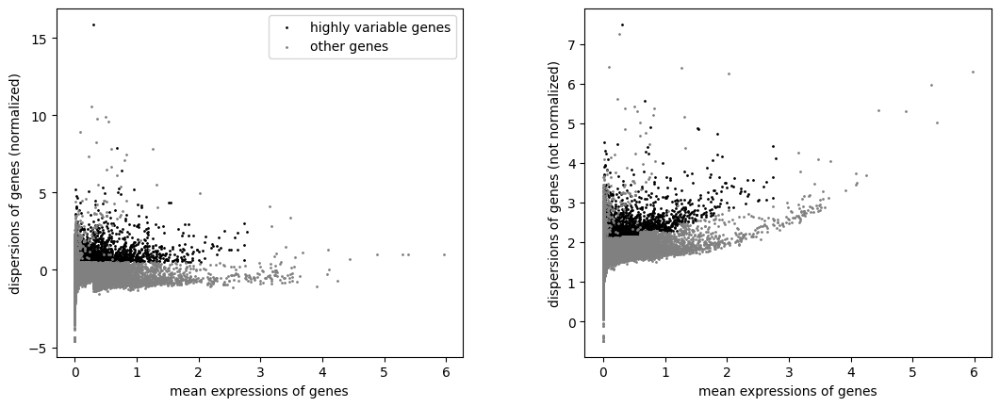

In [45]:
import re

for i in adata.var.index:
    if re.search("Tr[abdg][vdjc]|Tcr|Ig[hkl][vdjc]", i):
        adata.var.at[i, "highly_variable"] = False
sc.pl.highly_variable_genes(adata)


In [46]:
adata.raw = adata

In [47]:
adata = adata[:, adata.var.highly_variable].copy()
adata

AnnData object with n_obs × n_vars = 6823 × 2742
    obs: 'sample_id', 'sample_num', 'group', 'tissue', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ig', 'pct_counts_ig', 'leiden', 'filter_rna', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VDJ_main', 'j_call_VJ_main', 'c_call_VDJ_main', 'c_call_VJ_main', 'v_call_abT_VDJ_main', 'd_call_ab

In [40]:
sc.pp.regress_out(adata, ["total_counts", "pct_counts_mt", "pct_counts_ig"])


In [48]:
sc.pp.scale(adata, max_value=10)


In [49]:
sc.tl.pca(adata, svd_solver="arpack")


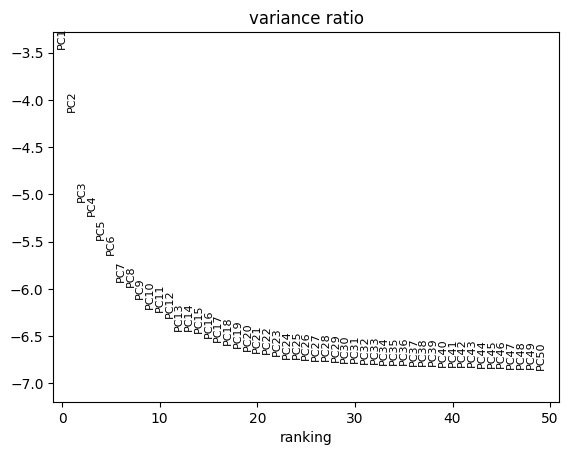

In [50]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

In [51]:
sc.external.pp.bbknn(adata, "sample_id")
sc.tl.umap(adata, min_dist=0.3)


In [52]:
sc.tl.leiden(adata, key_added="leiden_T")


/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:39

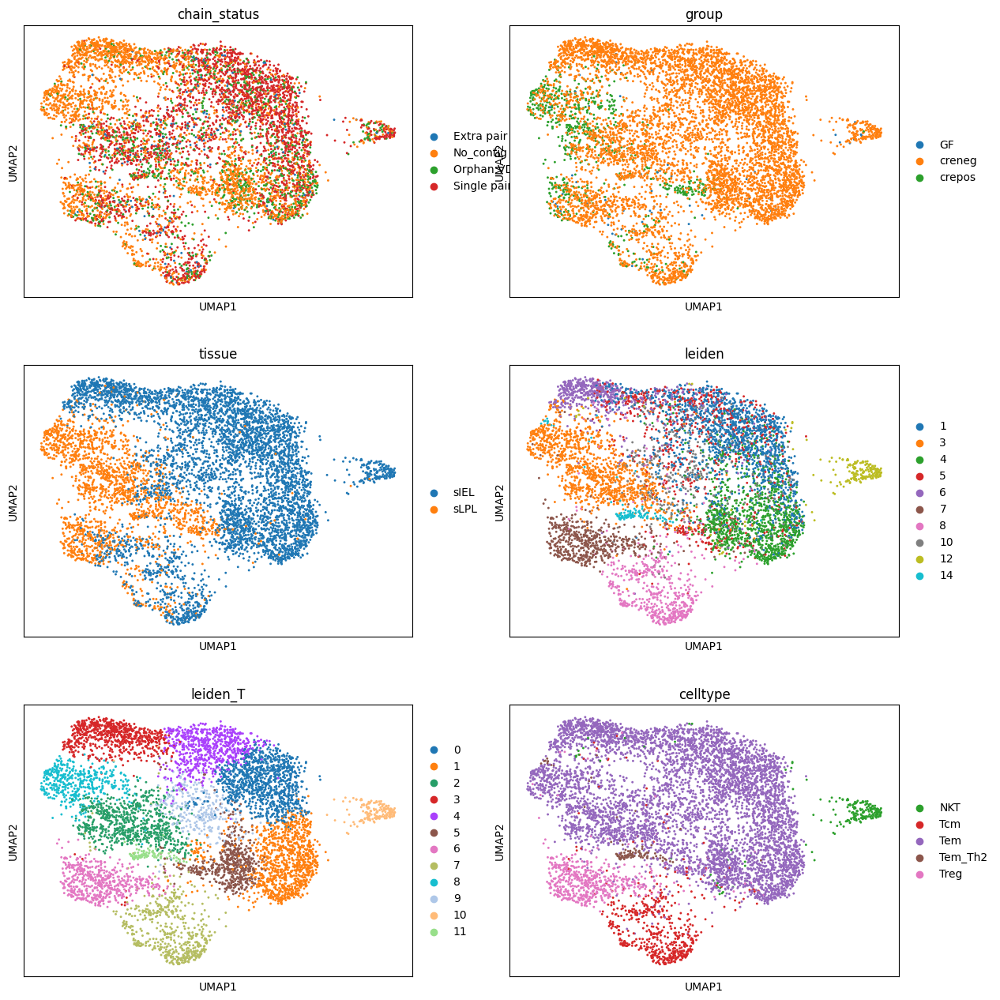

In [55]:
sc.pl.umap(
    adata,
    color=[
        "chain_status",
        "group",
        "tissue",
        "leiden",
        "leiden_T",
        "celltype",
    ],
    ncols=2,
)

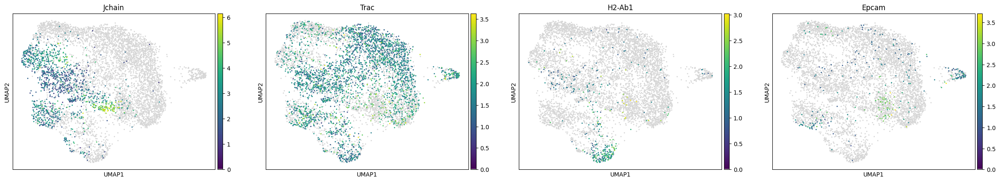

In [61]:
sc.pl.umap(adata, color=["Jchain", "Trac", "H2-Ab1", "Epcam"], color_map=tools.cmp())

/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


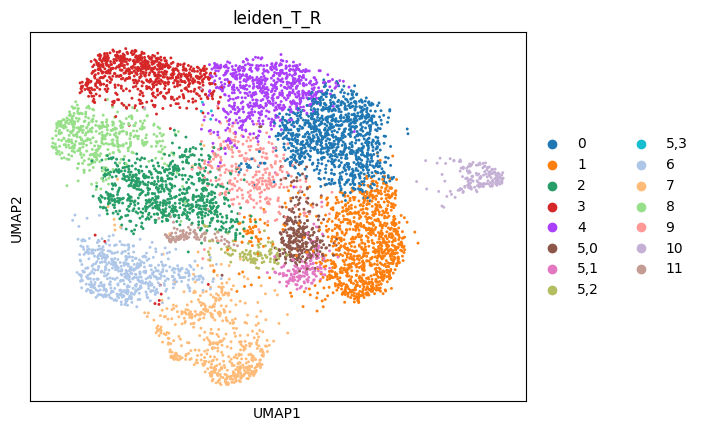

In [64]:
sc.tl.leiden(
    adata, key_added="leiden_T_R", restrict_to=("leiden_T", ["5"]), resolution=0.5
)
sc.pl.umap(adata, color="leiden_T_R")

/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


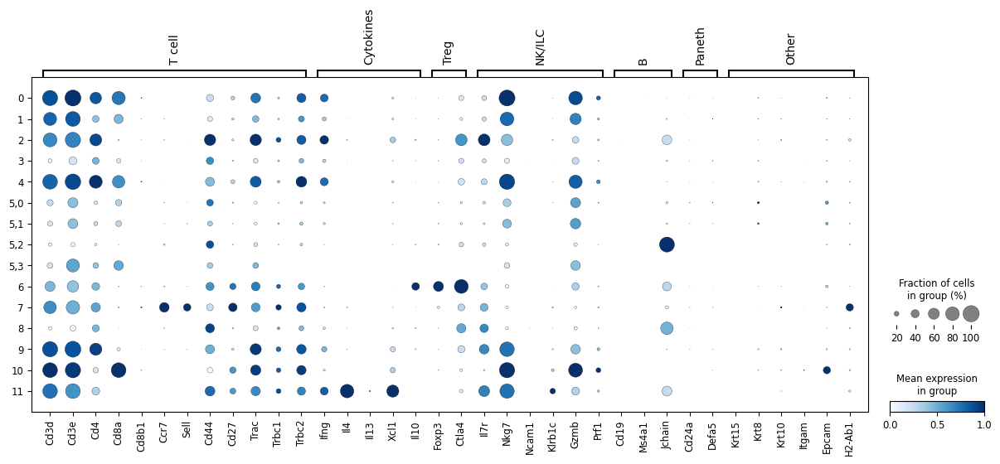

In [65]:
sc.pl.dotplot(
    adata,
    {
        "T cell": [
            "Cd3d",
            "Cd3e",
            "Cd4",
            "Cd8a",
            "Cd8b1",
            "Ccr7",
            "Sell",
            "Cd44",
            "Cd27",
            "Trac",
            "Trbc1",
            "Trbc2",
        ],
        "Cytokines": ["Ifng", "Il4", "Il13", "Xcl1", "Il10"],
        "Treg": ["Foxp3", "Ctla4"],
        "NK/ILC": ["Il7r", "Nkg7", "Ncam1", "Klrb1c", "Gzmb", "Prf1"],
        "B": ["Cd19", "Ms4a1", "Jchain"],
        "Paneth": ["Cd24a", "Defa5"],
        "Other": ["Krt15", "Krt8", "Krt10", "Itgam", "Epcam", "H2-Ab1"],
    },
    groupby="leiden_T_R",
    standard_scale="var",
    color_map="Blues",
)


In [66]:
adata_raw = sc.read_h5ad("write/adata_with_tcr.h5ad")

In [68]:
cell_dict = {
    "0": "Tem",
    "1": "Tem",
    "2": "Tem",
    "3": "Ambiguous",
    "4": "Tem",
    "5,0": "Tem",
    "5,1": "Tem",
    "5,2": "B",
    "5,3": "Tem",
    "6": "Treg",
    "7": "Tcm",
    "8": "B",
    "9": "Tem",
    "10": "NKT",
    "11": "Tem_Th2",
}
adata.obs["celltype"] = [cell_dict[x] for x in adata.obs["leiden_T_R"]]

/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


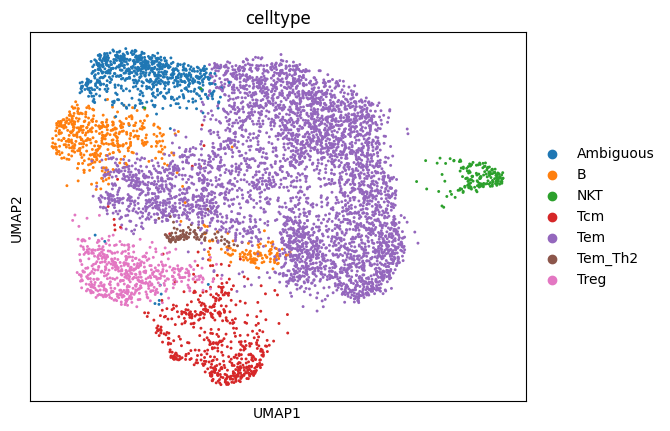

In [69]:
sc.pl.umap(
    adata,
    color=[
        "celltype",
    ],
    ncols=2,
)

/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


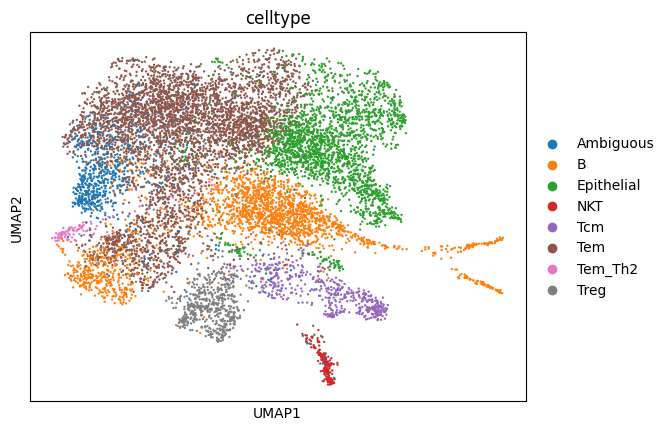

In [70]:
# update the original
adata_raw.obs["celltype"] = adata_raw.obs["celltype"].astype(str)
adata_raw.obs["celltype"].update(adata.obs["celltype"])
sc.pl.umap(adata_raw, color="celltype")


In [71]:
# save
adata_raw.write_h5ad("write/adata_with_tcr.h5ad", compression="gzip")

# repeat the clean up

In [72]:
# remove the obvious non-Ts
adata = adata_raw[
    adata_raw.obs["celltype"].isin(["NKT", "Tcm", "Tem", "Treg", "Tem_Th2"])
].copy()
adata

AnnData object with n_obs × n_vars = 5546 × 1731
    obs: 'sample_id', 'sample_num', 'group', 'tissue', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ig', 'pct_counts_ig', 'leiden', 'filter_rna', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VDJ_main', 'j_call_VJ_main', 'c_call_VDJ_main', 'c_call_VJ_main', 'v_call_abT_VDJ_main', 'd_call_ab

In [73]:
# re-cluster
adata = adata.raw.to_adata()
adata

AnnData object with n_obs × n_vars = 5546 × 18062
    obs: 'sample_id', 'sample_num', 'group', 'tissue', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ig', 'pct_counts_ig', 'leiden', 'filter_rna', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VDJ_main', 'j_call_VJ_main', 'c_call_VDJ_main', 'c_call_VJ_main', 'v_call_abT_VDJ_main', 'd_call_a

In [74]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)


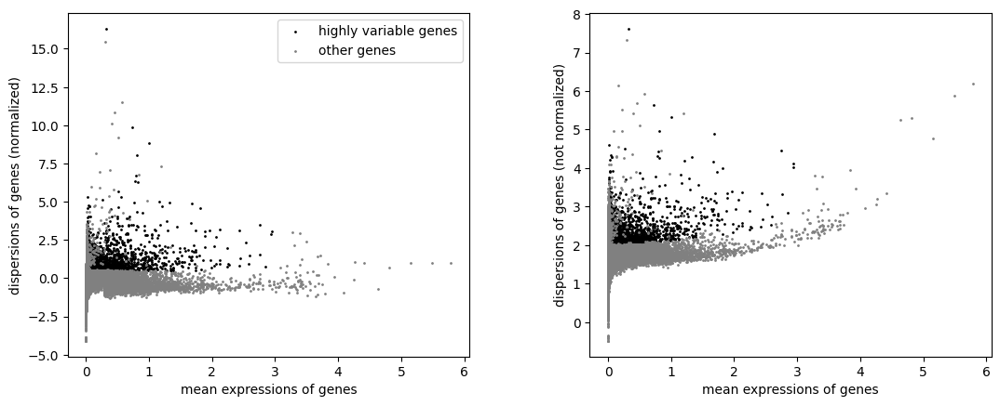

In [75]:
import re

for i in adata.var.index:
    if re.search("Tr[abdg][vdjc]|Tcr|Ig[hkl][vdjc]", i):
        adata.var.at[i, "highly_variable"] = False
sc.pl.highly_variable_genes(adata)


In [76]:
adata.raw = adata

In [77]:
adata = adata[:, adata.var.highly_variable].copy()
adata

AnnData object with n_obs × n_vars = 5546 × 2558
    obs: 'sample_id', 'sample_num', 'group', 'tissue', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ig', 'pct_counts_ig', 'leiden', 'filter_rna', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VDJ_main', 'j_call_VJ_main', 'c_call_VDJ_main', 'c_call_VJ_main', 'v_call_abT_VDJ_main', 'd_call_ab

In [78]:
sc.pp.regress_out(adata, ["total_counts", "pct_counts_mt", "pct_counts_ig"])


In [79]:
sc.pp.scale(adata, max_value=10)


In [80]:
sc.tl.pca(adata, svd_solver="arpack")


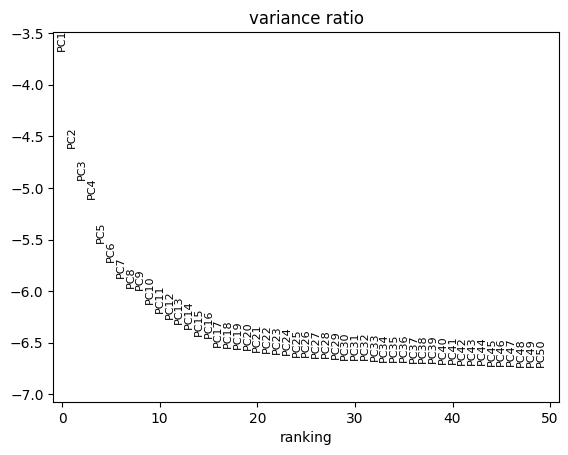

In [81]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

In [82]:
sc.external.pp.bbknn(adata, "sample_id")
sc.tl.umap(adata, min_dist=0.3)


In [83]:
sc.tl.leiden(adata, key_added="leiden_T")


/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:39

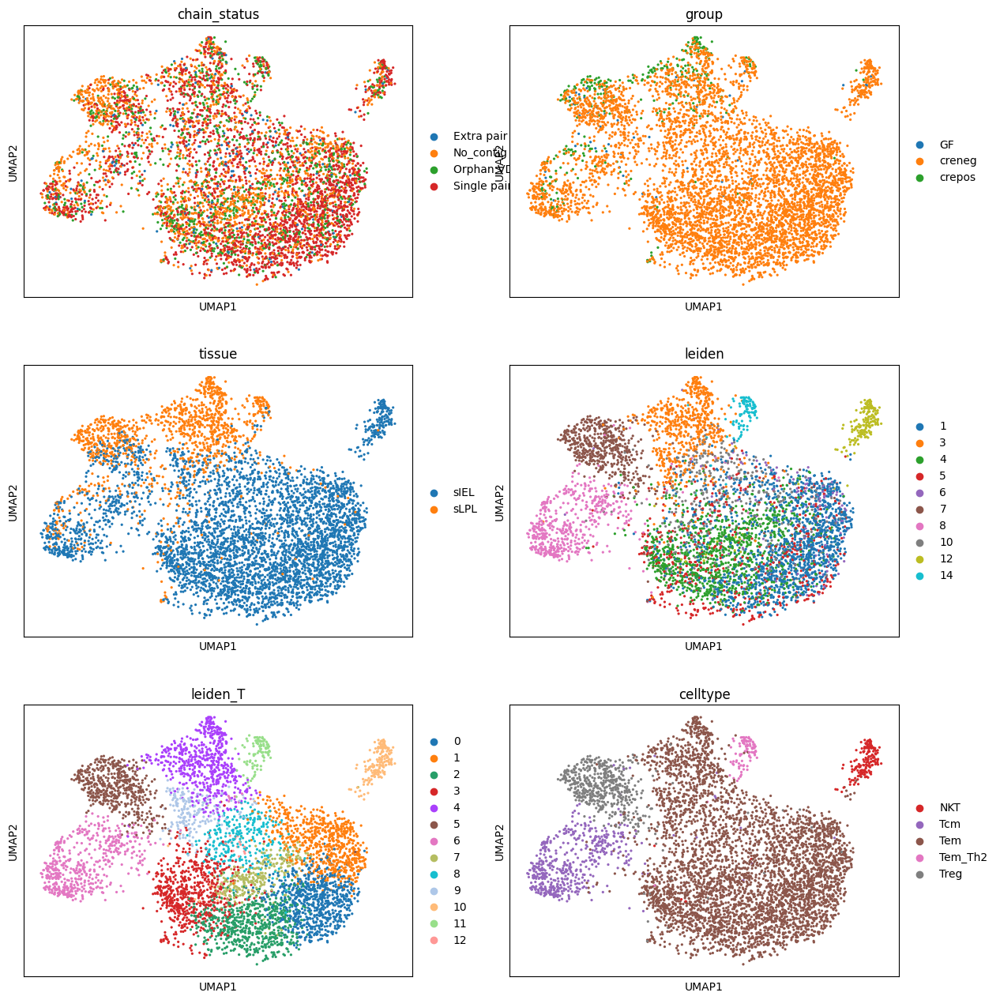

In [86]:
sc.pl.umap(
    adata,
    color=[
        "chain_status",
        "group",
        "tissue",
        "leiden",
        "leiden_T",
        "celltype",
    ],
    ncols=2,
)

/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


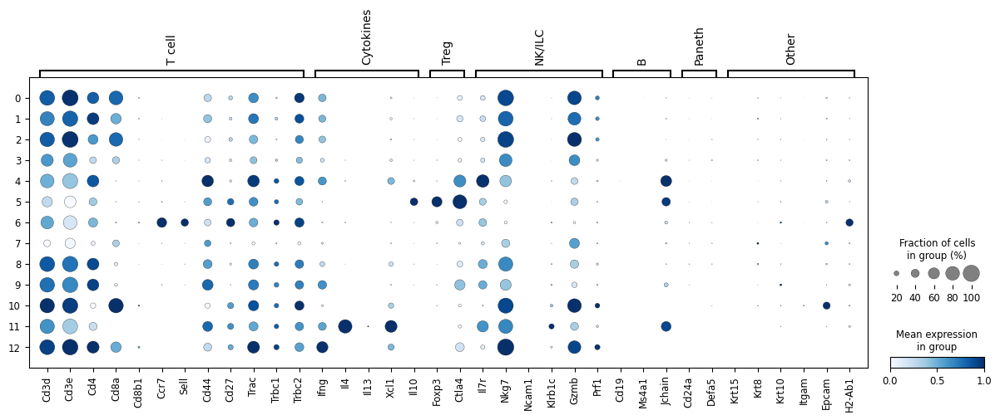

In [85]:
sc.pl.dotplot(
    adata,
    {
        "T cell": [
            "Cd3d",
            "Cd3e",
            "Cd4",
            "Cd8a",
            "Cd8b1",
            "Ccr7",
            "Sell",
            "Cd44",
            "Cd27",
            "Trac",
            "Trbc1",
            "Trbc2",
        ],
        "Cytokines": ["Ifng", "Il4", "Il13", "Xcl1", "Il10"],
        "Treg": ["Foxp3", "Ctla4"],
        "NK/ILC": ["Il7r", "Nkg7", "Ncam1", "Klrb1c", "Gzmb", "Prf1"],
        "B": ["Cd19", "Ms4a1", "Jchain"],
        "Paneth": ["Cd24a", "Defa5"],
        "Other": ["Krt15", "Krt8", "Krt10", "Itgam", "Epcam", "H2-Ab1"],
    },
    groupby="leiden_T",
    standard_scale="var",
    color_map="Blues",
)


/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


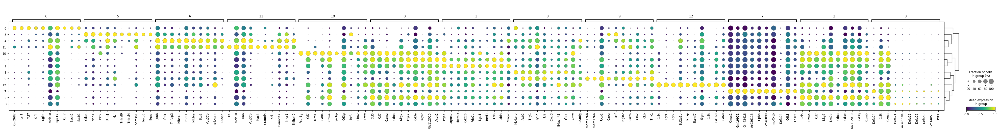

In [87]:
sc.tl.rank_genes_groups(adata, groupby="leiden_T", method="wilcoxon")
sc.pl.rank_genes_groups_dotplot(
    adata, n_genes=10, min_logfoldchange=1, standard_scale="var", color_map="viridis"
)


In [2]:
adata_raw = sc.read_h5ad("write/adata_with_tcr.h5ad")

In [3]:
adata = sc.read_h5ad("write/adata_with_tcr_tnk.h5ad")
adata

AnnData object with n_obs × n_vars = 5546 × 2558
    obs: 'sample_id', 'sample_num', 'group', 'tissue', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ig', 'pct_counts_ig', 'leiden', 'filter_rna', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VDJ_main', 'j_call_VJ_main', 'c_call_VDJ_main', 'c_call_VJ_main', 'v_call_abT_VDJ_main', 'd_call_ab

/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


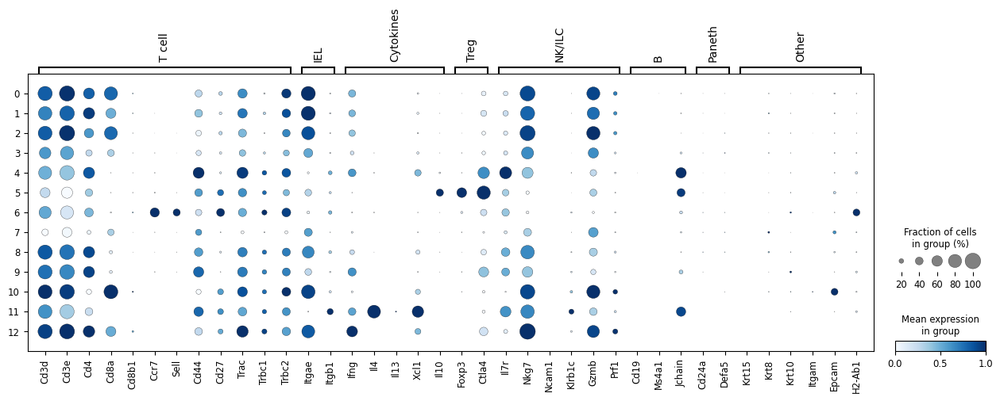

In [4]:
sc.pl.dotplot(
    adata,
    {
        "T cell": [
            "Cd3d",
            "Cd3e",
            "Cd4",
            "Cd8a",
            "Cd8b1",
            "Ccr7",
            "Sell",
            "Cd44",
            "Cd27",
            "Trac",
            "Trbc1",
            "Trbc2",
        ],
        "IEL": ["Itgae", "Itgb1"],
        "Cytokines": ["Ifng", "Il4", "Il13", "Xcl1", "Il10"],
        "Treg": ["Foxp3", "Ctla4"],
        "NK/ILC": ["Il7r", "Nkg7", "Ncam1", "Klrb1c", "Gzmb", "Prf1"],
        "B": ["Cd19", "Ms4a1", "Jchain"],
        "Paneth": ["Cd24a", "Defa5"],
        "Other": ["Krt15", "Krt8", "Krt10", "Itgam", "Epcam", "H2-Ab1"],
    },
    groupby="leiden_T",
    standard_scale="var",
    color_map="Blues",
)

In [89]:
cell_dict = {
    "0": "Tem",
    "1": "Tem",
    "2": "Tem",
    "3": "Tem",
    "4": "Tem",
    "5": "Treg",
    "6": "Tcm",
    "7": "Tem",
    "8": "Tem",
    "9": "Tem",
    "10": "NKT",
    "11": "Tem_Th2",
    "12": "Tem",
}
adata.obs["celltype"] = [cell_dict[x] for x in adata.obs["leiden_T"]]
cell_dict2 = {
    "0": "DP Tem",
    "1": "DP Tem",
    "2": "DP Tem",
    "3": "DP Tem",
    "4": "CD4 Tem",
    "5": "CD4 Treg",
    "6": "CD4 Tcm",
    "7": "DP Tem",
    "8": "CD4 Tem",
    "9": "CD4 Tem",
    "10": "NKT",
    "11": "CD4 Tem_Th2",
    "12": "DP Tem",
}
adata.obs["celltype-fine"] = [cell_dict2[x] for x in adata.obs["leiden_T"]]


/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


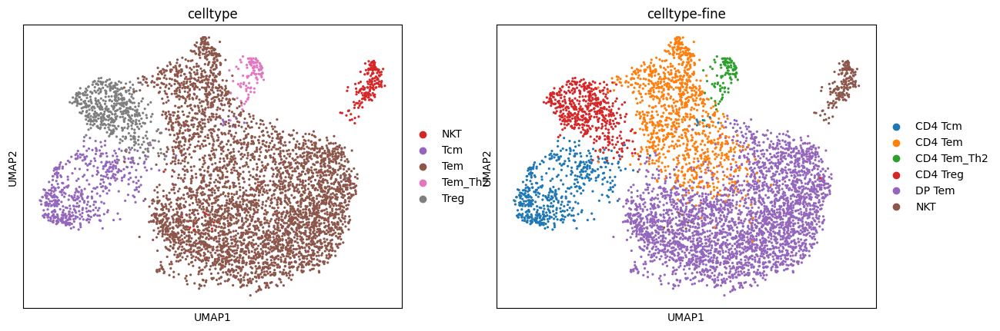

In [90]:
sc.pl.umap(
    adata,
    color=["celltype", "celltype-fine"],
    ncols=2,
)


/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/uqztuong/miniconda3/envs/dandelion/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


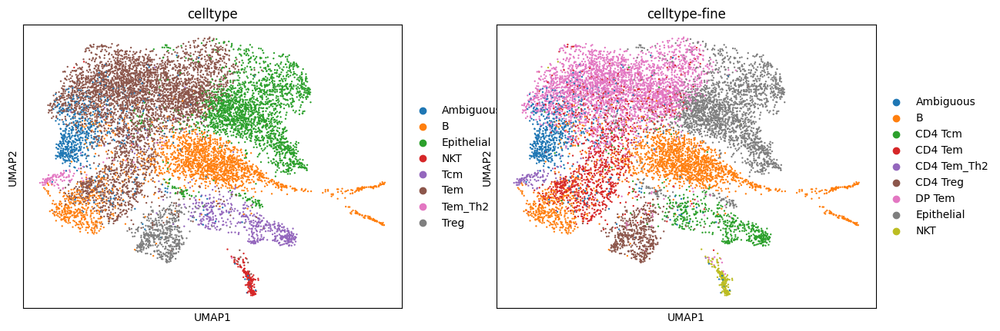

In [91]:
# update the original
adata_raw.obs["celltype"] = adata_raw.obs["celltype"].astype(str)
adata_raw.obs["celltype-fine"] = adata_raw.obs["celltype"]
adata_raw.obs["celltype"].update(adata.obs["celltype"])
adata_raw.obs["celltype-fine"].update(adata.obs["celltype-fine"])
sc.pl.umap(adata_raw, color=["celltype", "celltype-fine"])

In [92]:
# save
adata_raw.write_h5ad("write/adata_with_tcr.h5ad", compression="gzip")

In [93]:
adata.write_h5ad("write/adata_with_tcr_tnk.h5ad", compression="gzip")

In [2]:
adata = sc.read_h5ad("write/adata_with_tcr_tnk.h5ad")
adata


AnnData object with n_obs × n_vars = 5546 × 2558
    obs: 'sample_id', 'sample_num', 'group', 'tissue', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ig', 'pct_counts_ig', 'leiden', 'filter_rna', 'has_contig', 'filter_contig_quality', 'filter_contig_VDJ', 'filter_contig_VJ', 'contig_QC_pass', 'filter_contig', 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VDJ_main', 'j_call_VJ_main', 'c_call_VDJ_main', 'c_call_VJ_main', 'v_call_abT_VDJ_main', 'd_call_ab

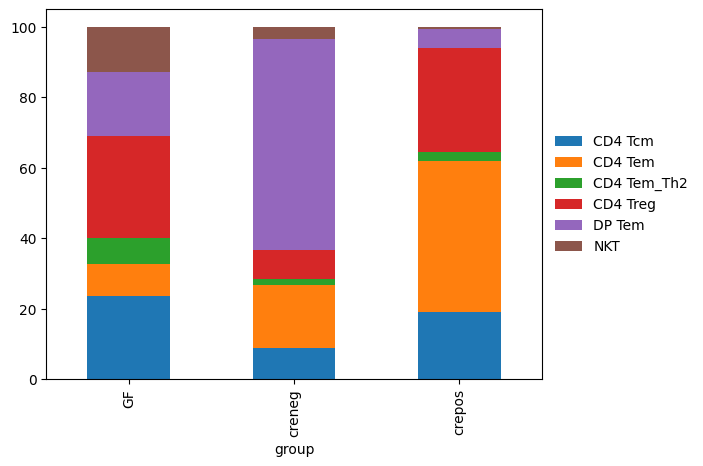

In [8]:
### give this to virginia
import matplotlib.pyplot as plt
import pandas as pd

# percentage of cells from group
pd.crosstab(adata.obs["group"], adata.obs["celltype-fine"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)


In [10]:
pd.crosstab(adata.obs["group"], adata.obs["celltype-fine"])

celltype-fine,CD4 Tcm,CD4 Tem,CD4 Tem_Th2,CD4 Treg,DP Tem,NKT
group,,,,,,
GF,13,5,4,16,10,7
creneg,452,925,91,414,3104,170
crepos,64,143,9,99,18,2


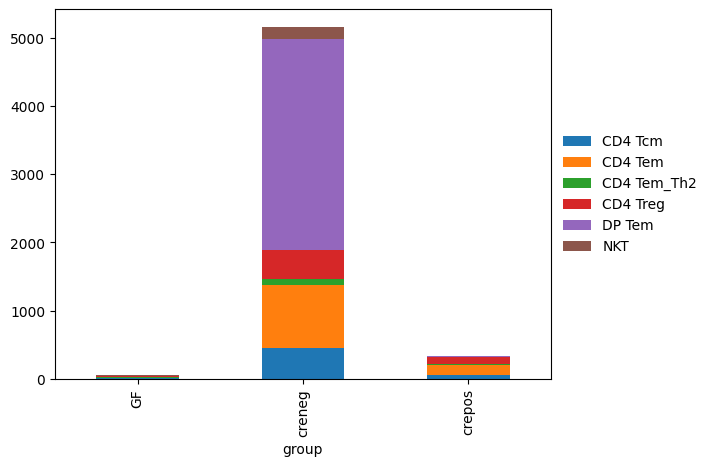

In [9]:
pd.crosstab(adata.obs["group"], adata.obs["celltype-fine"]).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)


In [94]:
import pandas as pd

# percentage of cells with TCR in fine annotation
pd.crosstab(adata.obs["celltype-fine"], adata.obs["chain_status"]).apply(
    lambda r: r / r.sum() * 100, axis=1
)

chain_status,Extra pair,No_contig,Orphan VDJ,Single pair
celltype-fine,,,,
CD4 Tcm,5.293006,37.240076,16.068053,41.398866
CD4 Tem,6.244175,26.933830,18.173346,48.648649
CD4 Tem_Th2,0.961538,23.076923,41.346154,34.615385
CD4 Treg,2.457467,52.551985,16.446125,28.544423
DP Tem,2.458493,30.715198,19.220945,47.605364
NKT,3.351955,27.932961,18.994413,49.720670


In [95]:
# percentage of cells with TCR in main annotation
pd.crosstab(adata.obs["celltype"], adata.obs["chain_status"]).apply(
    lambda r: r / r.sum() * 100, axis=1
)

chain_status,Extra pair,No_contig,Orphan VDJ,Single pair
celltype,,,,
NKT,3.351955,27.932961,18.994413,49.720670
Tcm,5.293006,37.240076,16.068053,41.398866
Tem,3.424495,29.750297,18.953627,47.871581
Tem_Th2,0.961538,23.076923,41.346154,34.615385
Treg,2.457467,52.551985,16.446125,28.544423


In [96]:
# percentage of cells from group
pd.crosstab(adata.obs["group"], adata.obs["celltype"]).apply(
    lambda r: r / r.sum() * 100, axis=1
)

celltype,NKT,Tcm,Tem,Tem_Th2,Treg
group,,,,,
GF,12.727273,23.636364,27.272727,7.272727,29.090909
creneg,3.297130,8.766486,78.141971,1.764934,8.029480
crepos,0.597015,19.104478,48.059701,2.686567,29.552239


In [97]:
pd.crosstab(adata.obs["celltype"], adata.obs["group"])

group,GF,creneg,crepos
celltype,,,
NKT,7,170,2
Tcm,13,452,64
Tem,15,4029,161
Tem_Th2,4,91,9
Treg,16,414,99


In [98]:
# percentage of cells from group
pd.crosstab(adata.obs["celltype"], adata.obs["group"]).apply(
    lambda r: r / r.sum() * 100, axis=0
)

group,GF,creneg,crepos
celltype,,,
NKT,12.727273,3.297130,0.597015
Tcm,23.636364,8.766486,19.104478
Tem,27.272727,78.141971,48.059701
Tem_Th2,7.272727,1.764934,2.686567
Treg,29.090909,8.029480,29.552239
